<a href="https://colab.research.google.com/github/MasoudMoeini/Google-Street-View-Images-Blur-Detection/blob/main/SBDN_Shi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [44]:
import cv2
import numpy as np
import os
import glob
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
from tensorflow import keras
from keras import layers
from keras.models import Sequential, Model,load_model
from keras.optimizers import gradient_descent_v2 
from google.colab.patches import cv2_imshow
from keras.layers import Input, Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D,MaxPool2D
from keras.preprocessing import image
from keras.initializers import glorot_uniform
from keras import regularizers

In [2]:
!unzip -qq train.zip

In [45]:
from numpy import *
images_folder= "train/images/*.jpg"
labels_folder = "train/labels/"
def data_preprocessing(images_folder,labels_folder):
  total_img = []
  class_label=[]
  label = []
  files = glob.glob (images_folder)
  for myFile in files:
      image_name=os.path.split(myFile)[1]
      class_label.append(float(image_name[0]))
      image = array(Image.open(myFile))
      label_image = array(Image.open(labels_folder+image_name))
      label.append (label_image)
      total_img.append (image)
  total_img = np.array(total_img)
  label = np.array(label)
  label= np.reshape(label,[label.shape[0],label.shape[1],label.shape[2]])
  total_img= np.reshape(total_img,[total_img.shape[0],total_img.shape[1],total_img.shape[2],total_img.shape[3]])
  class_label=np.array(class_label) 
  return label,total_img,class_label

In [46]:
total_labels,total_images,class_labels=data_preprocessing(images_folder,labels_folder)

In [47]:
total_images.shape

(984, 224, 224, 3)

In [48]:
def identity_block(X, f, filters, stage, block):
   
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    F1, F2, F3 = filters

    X_shortcut = X
   
    X = Conv2D(filters=F1, kernel_size=(1, 1), strides=(1, 1), padding='valid', name=conv_name_base + '2a', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2a')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F2, kernel_size=(f, f), strides=(1, 1), padding='same', name=conv_name_base + '2b', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F3, kernel_size=(1, 1), strides=(1, 1), padding='valid', name=conv_name_base + '2c', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2c')(X)

    X = Add()([X, X_shortcut])# SKIP Connection
    X = Activation('relu')(X)

    return X

In [49]:
def convolutional_block(X, f, filters, stage, block, s=2):
   
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'

    F1, F2, F3 = filters

    X_shortcut = X

    X = Conv2D(filters=F1, kernel_size=(1, 1), strides=(s, s), padding='valid', name=conv_name_base + '2a', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2a')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F2, kernel_size=(f, f), strides=(1, 1), padding='same', name=conv_name_base + '2b', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters=F3, kernel_size=(1, 1), strides=(1, 1), padding='valid', name=conv_name_base + '2c', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name=bn_name_base + '2c')(X)

    X_shortcut = Conv2D(filters=F3, kernel_size=(1, 1), strides=(s, s), padding='valid', name=conv_name_base + '1', kernel_initializer=glorot_uniform(seed=0))(X_shortcut)
    X_shortcut = BatchNormalization(axis=3, name=bn_name_base + '1')(X_shortcut)

    X = Add()([X, X_shortcut])
    X = Activation('relu')(X)

    return X

In [88]:
def decoder_network(X):
    #x_input = layers.Input(shape=(147))
    #x = keras.layers.Reshape([7,7,3])(dX)
    x = layers.Conv2DTranspose(2048, (3, 3), strides=2, activation="relu", padding="same")(X)
    x = layers.Conv2DTranspose(512, (3, 3), strides=2, activation="relu", padding="same")(x)
    x = layers.Conv2DTranspose(128, (3, 3), strides=2, activation="relu", padding="same")(x)
    x = layers.Conv2DTranspose(32, (3, 3), strides=2, activation="relu", padding="same")(x)
    x = layers.Conv2DTranspose(3, (3, 3), strides=2, activation="relu", padding="same")(x)
    x = layers.Conv2DTranspose(3, (3, 3), strides=1, activation="relu",kernel_regularizer=regularizers.L2(l2=0.0005),
      bias_regularizer=regularizers.L2(l2=0.005), padding="same")(x)
    x = layers.Conv2DTranspose(3, (3, 3), strides=1, activation="sigmoid",kernel_regularizer=regularizers.L2(l2=0.0005),
      bias_regularizer=regularizers.L2(l2=0.005), padding="same")(x)
    output = layers.Conv2DTranspose(1, (3, 3), strides=1, activation="sigmoid", padding="same",kernel_regularizer=regularizers.L2(l2=0.005),
      bias_regularizer=regularizers.L2(l2=0.0005), name="ident")(x)
    #model = Model(inputs=X, outputs=output, name='decoder_network')
    return output

In [72]:
def ResNet50():
    #X_input = keras.Input(shape=(224, 224, 3))
    X_input = layers.Input(shape=(224, 224, 3))
    #X = data_augmentation(X_input)
    #X = layers.Rescaling(1./255)(X)
    X = ZeroPadding2D((3, 3))(X_input)
    X = Conv2D(64, (7, 7), strides=(2, 2), name='conv1', kernel_initializer=glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis=3, name='bn_conv1')(X)
    X = Activation('relu')(X)
    X = MaxPooling2D((3, 3), strides=(2, 2))(X)

    X = convolutional_block(X, f=3, filters=[64, 64, 256], stage=2, block='a', s=1)
    X = identity_block(X, 3, [64, 64, 256], stage=2, block='b')
    X = identity_block(X, 3, [64, 64, 256], stage=2, block='c')


    X = convolutional_block(X, f=3, filters=[128, 128, 512], stage=3, block='a', s=2)
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='b')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='c')
    X = identity_block(X, 3, [128, 128, 512], stage=3, block='d')

    X = convolutional_block(X, f=3, filters=[256, 256, 1024], stage=4, block='a', s=2)
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='b')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='c')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='d')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='e')
    X = identity_block(X, 3, [256, 256, 1024], stage=4, block='f')
    X = X = convolutional_block(X, f=3, filters=[512, 512, 2048], stage=5, block='a', s=2)
    X = identity_block(X, 3, [512, 512, 2048], stage=5, block='b')
    X = identity_block(X, 3, [512, 512, 2048], stage=5, block='c')
    #7*7*2048
    output1=decoder_network(X)
    #X = AveragePooling2D(pool_size=(2, 2), padding='same')(X)
    #X = Flatten()(X)
    #X = Dense(256, activation='relu', name='fc1',kernel_initializer=glorot_uniform(seed=0))(X)
    #X = Dense(128, activation='relu', name='fc2',kernel_initializer=glorot_uniform(seed=0))(X)
    #main = Dense( 1,activation='sigmoid', name='main',kernel_initializer=glorot_uniform(seed=0))(X)
    model = Model(inputs=X_input, outputs=output1, name='ResNet50')
    return model

In [89]:
model= ResNet50()

In [90]:
loss1=tf.keras.losses.MeanSquaredError()
loss2=tf.keras.losses.BinaryCrossentropy()
model.compile(keras.optimizers.Adam(learning_rate=1e-3),loss = [loss1],metrics=["accuracy"])

In [91]:
class_label=class_labels[:500]
x_train = total_images[:500].astype(np.float32)/ 255.0
y_train=total_labels[:500].astype(np.float32)/ 255.0
y_train =(y_train)

In [92]:
history = model.fit(x_train,y_train, epochs=120,batch_size=20, validation_split=0.0,shuffle=True)
model.save('sbdn-shi-model.h5')

Epoch 1/120
25/25 [==============================] - 12s 243ms/step - loss: 0.2488 - accuracy: 0.5803
Epoch 2/120
25/25 [==============================] - 6s 243ms/step - loss: 0.2357 - accuracy: 0.6026
Epoch 3/120
25/25 [==============================] - 6s 243ms/step - loss: 0.2284 - accuracy: 0.6024
Epoch 4/120
25/25 [==============================] - 6s 243ms/step - loss: 0.2210 - accuracy: 0.6034
Epoch 5/120
25/25 [==============================] - 6s 243ms/step - loss: 0.2148 - accuracy: 0.6046
Epoch 6/120
25/25 [==============================] - 6s 245ms/step - loss: 0.2104 - accuracy: 0.6350
Epoch 7/120
25/25 [==============================] - 6s 243ms/step - loss: 0.2064 - accuracy: 0.6673
Epoch 8/120
25/25 [==============================] - 6s 244ms/step - loss: 0.1996 - accuracy: 0.7043
Epoch 9/120
25/25 [==============================] - 6s 244ms/step - loss: 0.1966 - accuracy: 0.7065
Epoch 10/120
25/25 [==============================] - 6s 243ms/step - loss: 0.1919 - accur

In [93]:
history_dict = history.history
print(history_dict.keys())

dict_keys(['loss', 'accuracy'])


In [94]:
import pandas as pd
hist_df = pd.DataFrame(history.history)
hist_csv_file = 'sbdn-shi-history.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

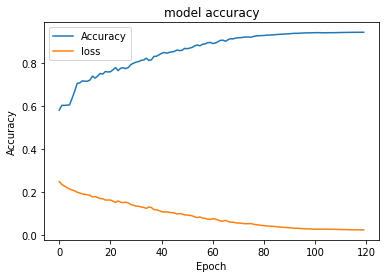

In [95]:
import matplotlib.pyplot as plt
plt.plot(history.history["accuracy"])
#plt.plot(history.history['val_accuracy'])
plt.plot(history.history['loss'])
#plt.plot(history.history['val_loss'])
plt.title("model accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["Accuracy","loss"])
plt.show()

In [96]:
eval_images=total_images[500:]
eval_labels=total_labels[500:]
eval_class_label=class_labels[500:]

In [97]:
from keras.models import load_model
from PIL import Image
images = eval_images
model = load_model("sbdn-shi-model.h5")
predictions=[]
for i in range(images.shape[0]):
  img = images[i]
  img = img.astype(np.float32)/ 255.0
  img = np.expand_dims(img, -1)
  img = np.expand_dims(img, 0)
  pred = model.predict(img)
  predictions.append(pred)

In [30]:
reshape((predictions[0])[0],[224,224]).shape

(224, 224)

In [82]:
len(predictions)

484

In [154]:
def get_iou_score(predictions,eval_labels):
  iou_scores=[]
  for i in range(len(predictions)):
    true_label = eval_labels[i]/255.0
    y_pred_label = np.where((((predictions[i])[0]))>0.5,1.0,0.0)
    y_pred_label=reshape(y_pred_label,[224,224])
    m = tf.keras.metrics.MeanIoU(num_classes=2)
    m.update_state(true_label, y_pred_label)
    iou_scores.append(m.result().numpy())
  return mean(iou_scores),iou_scores

In [155]:
iou_score,iou_scores= get_iou_score(predictions,eval_labels)

In [156]:
print('Average Intersection over Union IoU for Blur Detection: ',iou_score )

Average Intersection over Union IoU for Blur Detection:  0.6304659


## Average Optimal Image Scale OIS_F1 score

In [207]:
from sklearn.metrics import precision_score,recall_score
def recall_precison(y_pred,y_true):
  total_precision_score=[]
  total_recall_score=[]
  for i in range(0,len(y_pred)):
    pred_precision_score=[]
    pred_recall_score=[]
    pr=np.where((((y_pred[i])[0]))>0.5,1.0,0.0)
    pr=reshape(pr,[224,224])
    gt=y_true[i]/255.0
    gt=np.where(gt>0.5,1.0,0.0)
    for pix in range(0,224):
      prec=precision_score(gt[pix],pr[pix])
      recall=recall_score(gt[pix],pr[pix])
      pred_precision_score.append(prec)
      pred_recall_score.append(recall)
    total_precision_score.append(mean(pred_precision_score))
    total_recall_score.append(mean(pred_recall_score))
  return mean(total_precision_score),mean(total_recall_score)


In [ ]:
precision,reall=recall_precison(predictions,eval_labels)

In [209]:
print('Average Precision Score: ',precision )

Average Precision Score:  0.7695415118437975


In [210]:
print('Average Recall Score: ',reall )

Average Recall Score:  0.7408207909385562


In [212]:
OIS_f1=2*precision*reall/(precision+reall)
print('Average Optimal Image Scale F1 score: ',OIS_f1 )

Average Optimal Image Scale F1 score:  0.7549080779015257


predicted class vs true class


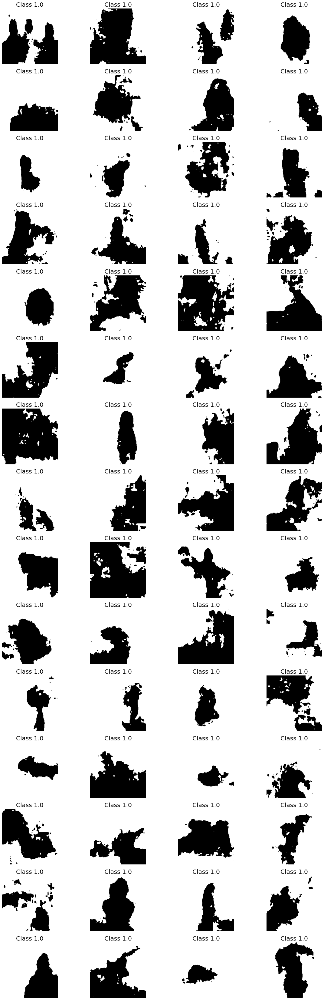

In [101]:
columns = 4
rows = 15
print("predicted class vs true class")
fig = plt.figure(figsize=(20,60))
for i in range(0, columns*rows):
  fig.add_subplot(rows, columns,i+1)
  img_pred_label = np.where(((predictions[i])[0])>0.5,1.0,0.0)
  #img_pred_label=(predictions[i])[0]
  plt.imshow(reshape(img_pred_label*255.0,[224,224]),cmap='gray')
  plt.title(f"Class {eval_class_label[i]}",fontsize=20)
  plt.axis("off")
plt.show()

predicted class vs true class


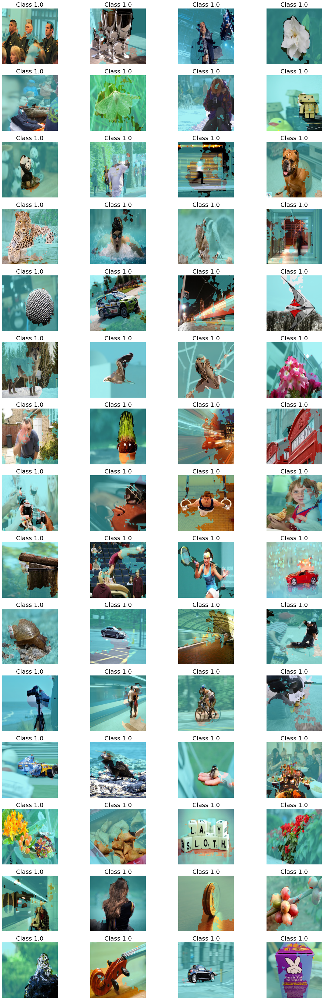

In [102]:
fig = plt.figure(figsize=(20,60))
columns = 4
rows = 15
print("predicted class vs true class")
for i in range(0, columns*rows):
  fig.add_subplot(rows, columns,i+1)
  img_pred_label = np.where((((predictions[i])[0]))>0.5,1.0,0.0)
  #img_pred_label=(predictions[i])[0]
  mask=(img_pred_label*255.0).astype(np.uint8)
  blackFrame = np.zeros((224,224, 3), dtype = "uint8")
  whiteFrame = 255 * np.ones((224,224,3), np.uint8)
  mask = np.where(mask==255,whiteFrame,blackFrame)
  img= images[i]
  cyan = np.full_like(img,(80, 229, 235))
  blend = 0.5
  img_cyan = cv2.addWeighted(img, blend, cyan, 1-blend, 0)
  mask = np.where(mask>=165,img_cyan,img)
  plt.imshow(mask,cmap='binary')
  plt.title(f"Class {eval_class_label[i]}",fontsize=20)
  plt.axis("off")
plt.show()

predicted class vs true class


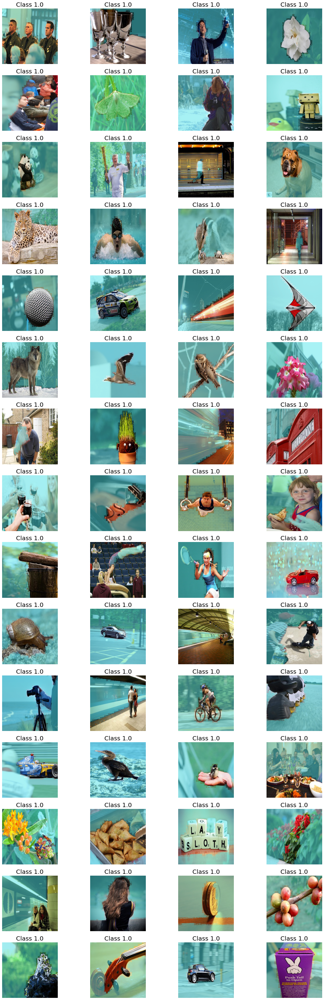

In [68]:
fig = plt.figure(figsize=(20,60))
columns = 4
rows = 15
originalImsges=[]
print("predicted class vs true class")
for i in range(0, columns*rows):
  fig.add_subplot(rows, columns,i+1)
  #img_pred_label = np.where((((predictions[i])[0]))>0.5,1.0,0.0)
  #mask=(img_pred_label*255.0).astype(np.uint8)
  mask=reshape(eval_labels[i],[224,224,1]).astype(np.uint8)
  blackFrame = np.zeros((224,224, 3), dtype = "uint8")
  whiteFrame = 255 * np.ones((224,224,3), np.uint8)
  mask = np.where(mask==255,whiteFrame,blackFrame)
  img= images[i]
  cyan = np.full_like(img,(80, 229, 235))
  blend = 0.5
  img_cyan = cv2.addWeighted(img, blend, cyan, 1-blend, 0)
  mask = np.where(mask>=165,img_cyan,img)
  originalImsges.append(mask)
  plt.imshow(mask,cmap='binary')
  plt.title(f"Class {eval_class_label[i]}",fontsize=20)
  plt.axis("off")
plt.show()

In [ ]:
len(originalImsges)

60

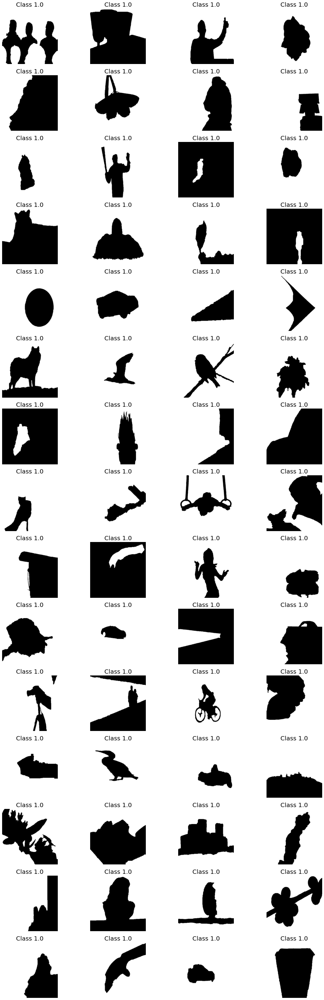

In [164]:
fig = plt.figure(figsize=(20,60))
columns = 4
rows = 15
for i in range(0, columns*rows):
  fig.add_subplot(rows, columns,i+1)
  plt.imshow(eval_labels[i],cmap='gray')
  plt.title(f"Class {eval_class_label[i]}",fontsize=20)
  plt.axis("off")
plt.show()

predicted class vs true class


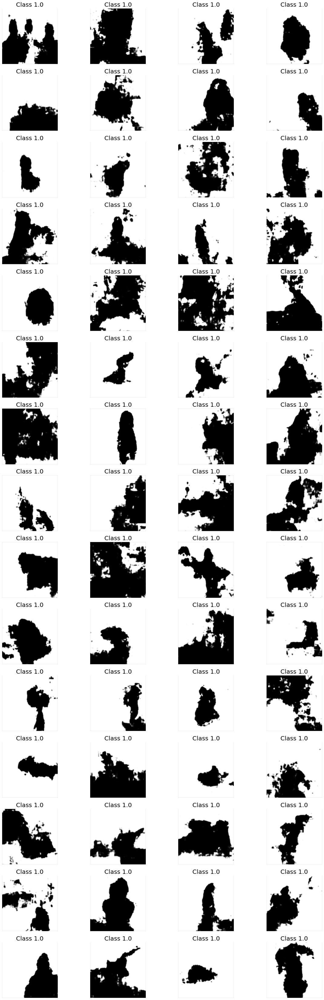

In [103]:
columns = 4
rows = 15
print("predicted class vs true class")
fig = plt.figure(figsize=(20,60))
for i in range(0, columns*rows):
  fig.add_subplot(rows, columns,i+1)
  #img_pred_label = np.where(((predictions[i])[0])>0.5,1.0,0.0)
  img_pred_label=(predictions[i])[0]
  plt.imshow(reshape(img_pred_label*255.0,[224,224]),cmap='gray')
  plt.title(f"Class {eval_class_label[i]}",fontsize=20)
  plt.axis("off")
plt.show()